In [1]:
%pylab inline
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Populating the interactive namespace from numpy and matplotlib


In [2]:
cld_1a = pd.read_csv("Desktop/clade1a_aai.tsv", sep = "\t")
cld_1a.head()

,Genome A,Genes in A,Genome B,Genes in B,# orthologous genes,Mean AAI,Std AAI,Orthologous fraction (OF)
0,AAAA,695,AAGI,613,146,75.65,16.82,23.82
1,AAAA,695,AAHK,1307,402,75.77,14.83,57.84
2,AAAA,695,AACI,883,248,74.61,17.03,35.68
3,AAAA,695,AAHG,971,283,74.04,15.11,40.72
4,AAAA,695,AADJ,606,141,72.56,19.29,23.27


In [3]:
interest = cld_1a[["Genome A", "Genome B", "Mean AAI"]]
interest.head()

,Genome A,Genome B,Mean AAI
0,AAAA,AAGI,75.65
1,AAAA,AAHK,75.77
2,AAAA,AACI,74.61
3,AAAA,AAHG,74.04
4,AAAA,AADJ,72.56


In [4]:
interest.pivot("Genome A", "Genome B", "Mean AAI").shape

(194, 216)

In [10]:
plt.figure(figsize = (194,216))
pivot_table = interest.pivot("Genome A", "Genome B", "Mean AAI")
plt.xlabel("Query SAG", size = 200)
plt.ylabel("Reference Genome", size = 200)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.title("AAI percentage Heatmap of Clade 1a SAR11 SAGs determind by WGS phylogenetics", size = 200)

ax = sns.heatmap(pivot_table, annot = True, fmt = ".2f", linewidths = 0, square = True, cmap = "Reds")

In [ ]:
plt.figure(figsize = (25,25))
pivot_table = interest.pivot("Genome A", "Genome B", "Mean AAI")
plt.xlabel("Query SAG", size = 25)
plt.ylabel("Reference Genome", size = 25)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.title("AAI percentage Heatmap of Clade 1a SAR11 SAGs determind by WGS phylogenetics", size = 25)

ax = sns.heatmap(pivot_table, annot = True, fmt = ".2f", linewidths = .5, square = True, cmap = "Reds")

In [7]:
figure = ax.get_figure()
figure.savefig('/home/minion/Desktop/clade_1a_heatmap.png', dpi=72)

In [24]:
cld1a = pd.read_csv("Desktop/1a.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld1b = pd.read_csv("Desktop/1b.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld1c = pd.read_csv("Desktop/1c.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld1d = pd.read_csv("Desktop/1d.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld2a = pd.read_csv("Desktop/2a.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld2b = pd.read_csv("Desktop/2b.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld2c = pd.read_csv("Desktop/2c.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld3a = pd.read_csv("Desktop/3a.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
cld4 = pd.read_csv("Desktop/4.tsv", sep = "\t", header = None, names = ("Query Id", "Target Id", "AAI", "OF", "Score"))
sags = pd.read_csv("Desktop/classify.tsv", sep = "\t")


cld1a['Phylo'] = "clade1a"
cld1b['Phylo'] = "clade1b"
cld1c['Phylo'] = "clade1c"
cld1d['Phylo'] = "clade1d"
cld2a['Phylo'] = "clade2a"
cld2b['Phylo'] = "clade2b"
cld2c['Phylo'] = "clade2c"
cld3a['Phylo'] = "clade3a"
cld4['Phylo'] = "clade4"

df = pd.concat([cld1a, cld1b, cld1c, cld1d, cld2a, cld2b, cld2c, cld3a, cld4])
abc = pd.merge(sags, df, how='outer')

In [ ]:
#abc.to_csv("Desktop/ANI.vs.Phylo.tsv", sep = "\t", index=False)

In [57]:
df = pd.read_csv("Desktop/ANI.vs.Phylo2.tsv.csv", sep = "\t")
df.head()

,Query Id,Target Id,AAI,OF,Score,Phylo,Discrepancy
0,AAHJ.reformatted,HIMB5_clade1a,94.26,86.39,180.65,clade1a,No
1,AAGA.reformatted,HTCC1002_clade1a,93.26,78.38,171.64,clade1a,No
2,AAGG.reformatted,HTCC1002_clade1a,93.04,82.22,175.26,clade1a,No
3,AAFZ.reformatted,HTCC1002_clade1a,92.41,73.83,166.24,clade1a,No
4,AAEF.reformatted,HTCC1002_clade1a,91.66,78.17,169.83,clade1a,No


<Figure size 1296x720 with 0 Axes>

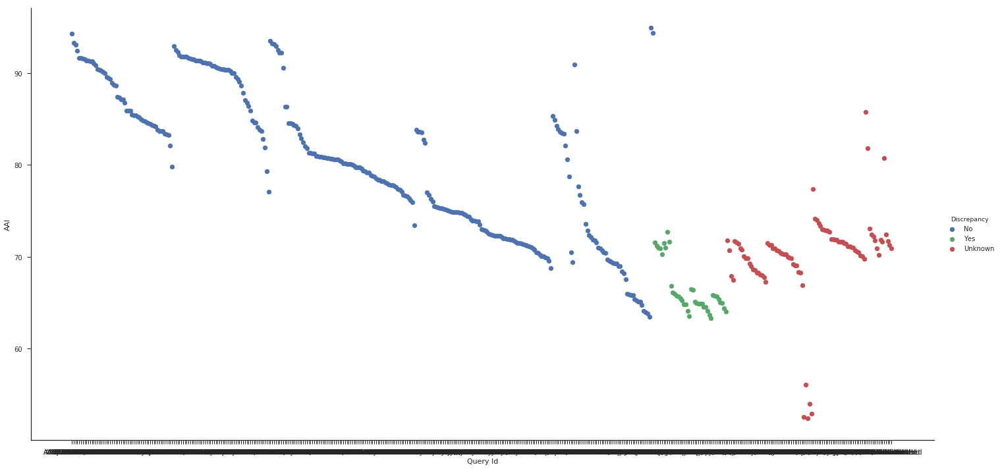

In [60]:
plt.figure(figsize=(18, 10), facecolor='w', edgecolor='k')
interest = df[["Query Id", "AAI", "Discrepancy"]]

fig = sns.FacetGrid(interest, hue="Discrepancy", size=10, aspect=2)
fig.map(plt.scatter, "Query Id", "AAI").add_legend()

In [61]:
fig.savefig('/home/minion/Desktop/ANI.vs.Phylo.sorted.png', dpi=150)